In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme()
sns.set_palette("colorblind")

In [3]:
Vs_array =  np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_range.csv", delimiter=",")

In [33]:
# Read correlations together
df1 = pd.read_csv(r"..\FLAC\FLAC2D\1D 1 Column\Results\correlations_1000.csv", header=None)
df1.columns = ["1000_points"]

df1["base"] = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\correlations_base.csv", delimiter=",")
df1["log_norm"] = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\correlations_lognorm.csv", delimiter=",")

df1["log_norm_1000"] = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\correlations_1000_lognorm.csv", delimiter=",")
#df1["log_norm_1000_noise"] = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\correlations_1000_lognorm_noise.csv", delimiter=",")

In [42]:
df1["Vs"] = Vs_array

Text(0, 0.5, 'Pearson Correlation Coefficient')

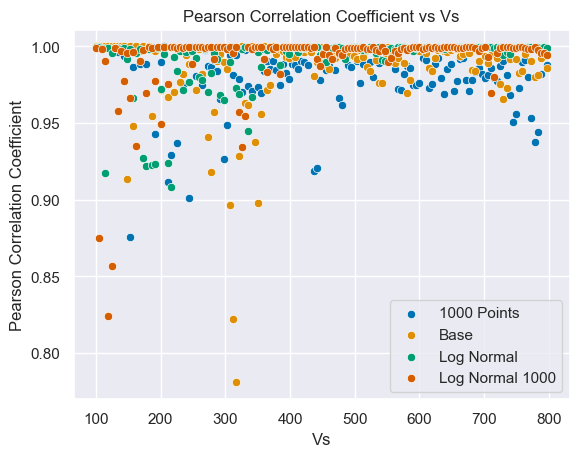

In [43]:
sns.scatterplot(data=df1, x="Vs", y="1000_points", label="1000 Points")
sns.scatterplot(data=df1, x="Vs", y="base", label="Base")
sns.scatterplot(data=df1, x="Vs", y="log_norm", label="Log Normal")
sns.scatterplot(data=df1, x="Vs", y="log_norm_1000", label="Log Normal 1000")
#sns.scatterplot(data=df1, x="1000_points", y="log_norm_1000_noise", label="Log Normal 1000 Noise")
plt.title("Pearson Correlation Coefficient vs Vs")
plt.xlabel("Vs")
plt.ylabel("Pearson Correlation Coefficient")

In [53]:
threshold_rho = 0.95
df1["base"].apply(lambda x: 1 if x > threshold_rho else 0).mean()

0.9246575342465754

In [54]:
df1["1000_points"].apply(lambda x: 1 if x > threshold_rho else 0).mean()


0.9178082191780822

In [55]:
df1["log_norm"].apply(lambda x: 1 if x > threshold_rho else 0).mean()

0.9452054794520548

In [56]:
df1["log_norm_1000"].apply(lambda x: 1 if x > threshold_rho else 0).mean()

0.958904109589041

In [58]:
df1.mean(axis=0)

1000_points        0.980931
base               0.984043
log_norm           0.991533
log_norm_1000      0.991655
Vs               448.697391
dtype: float64

In [40]:
def plot_comparison(x_axis, y_axis, df=df1):
    plt.figure()
    sns.scatterplot(x=x_axis, y=y_axis, data=df)
    plt.plot([0.7, 1], [0.7, 1], color="black", linestyle="--", alpha=0.7)
    plt.xlabel(x_axis)
    plt.ylabel(y_axis)
    plt.title("Plot Correlations")
    plt.show()

    # Count how many points are above the line vs below
    above_array = df[x_axis] < df[y_axis]
    below_array = df[x_axis] > df[y_axis]

    above = above_array.sum()
    below = below_array.sum()
    total = len(df)

    print(f"Above - {y_axis}: {above/total*100:.2f} %, Below - {x_axis}: {below/total*100:.2f} %")


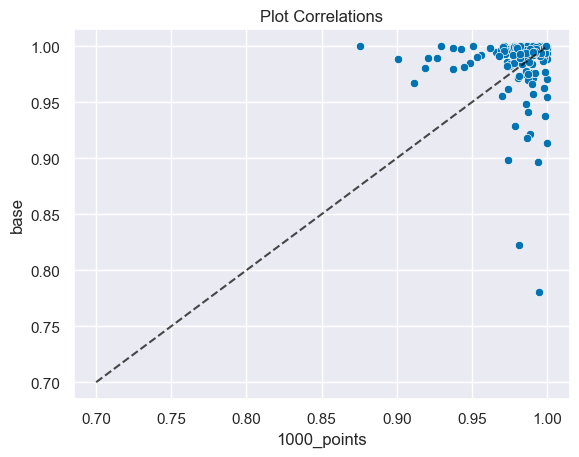

Above - base: 69.18 %, Below - 1000_points: 30.82 %


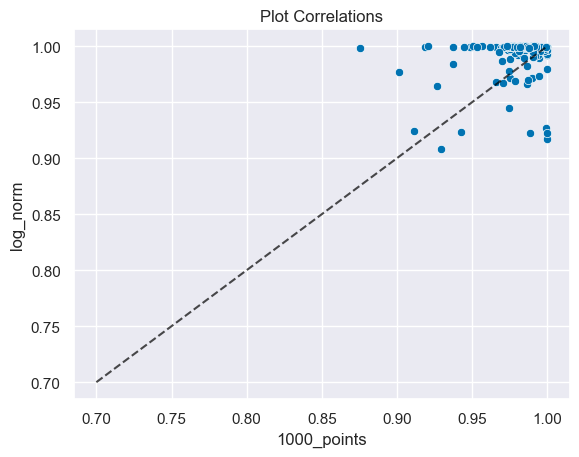

Above - log_norm: 75.34 %, Below - 1000_points: 24.66 %


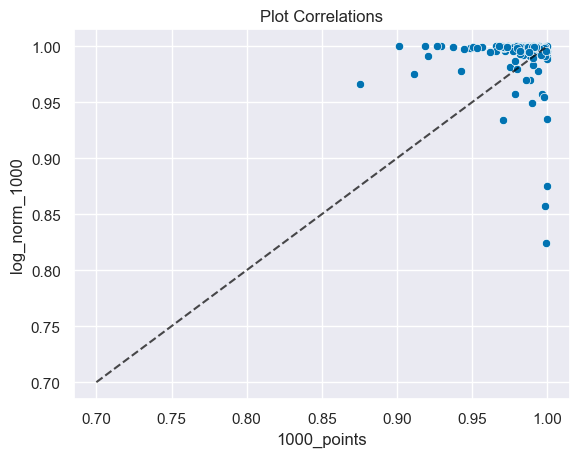

Above - log_norm_1000: 78.77 %, Below - 1000_points: 21.23 %


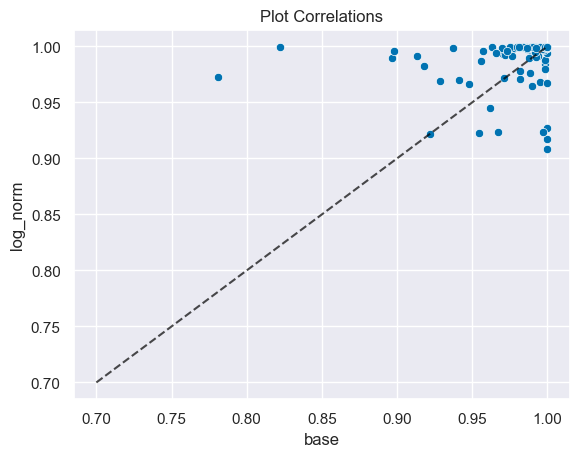

Above - log_norm: 67.81 %, Below - base: 32.19 %


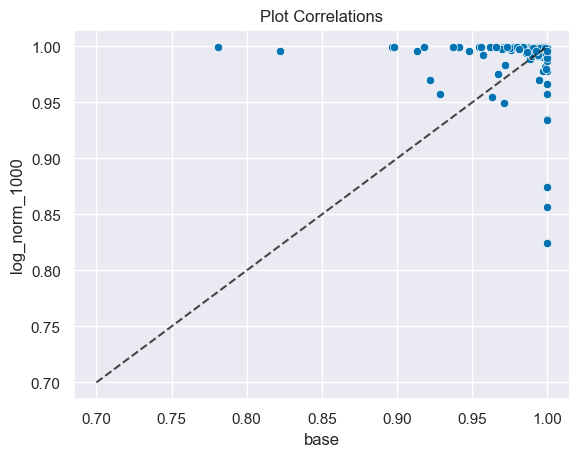

Above - log_norm_1000: 73.29 %, Below - base: 26.71 %


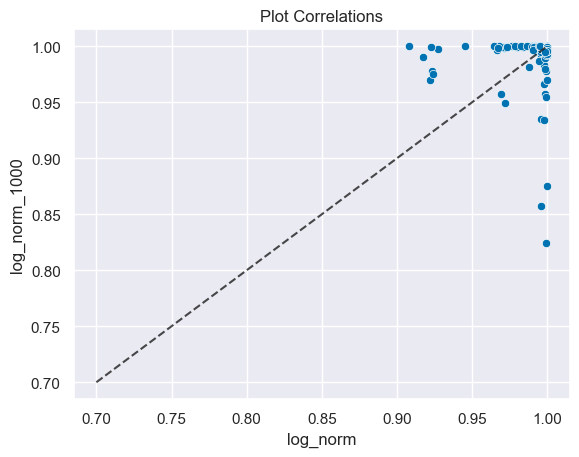

Above - log_norm_1000: 44.52 %, Below - log_norm: 55.48 %


In [41]:
plotted_pairs = set()
df1.drop(columns="Vs", inplace=True)
for i in df1.columns:
    for j in df1.columns:
        if i == j:
            continue
        elif (i, j) not in plotted_pairs and (j, i) not in plotted_pairs:
            plot_comparison(i, j)
            plotted_pairs.add((i, j))

In [45]:
# Comparison


Vs_array =  np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_range.csv", delimiter=",")

freq_array_1 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_freq_256.csv", delimiter=",")
freq_array_2 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_freq.csv", delimiter=",")
results_target_256 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_target_256.csv", delimiter=",")
results_target = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_target.csv", delimiter=",")
results_base = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_base.csv", delimiter=",")
results_1000 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_1000.csv", delimiter=",")
results_lognorm = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_lognorm.csv", delimiter=",")
results_lognorm_1000 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_1000_lognorm.csv", delimiter=",")

In [49]:
df1["1000_points"][df1["Vs"] == Vs_array[0]].values

array([0.99999288])

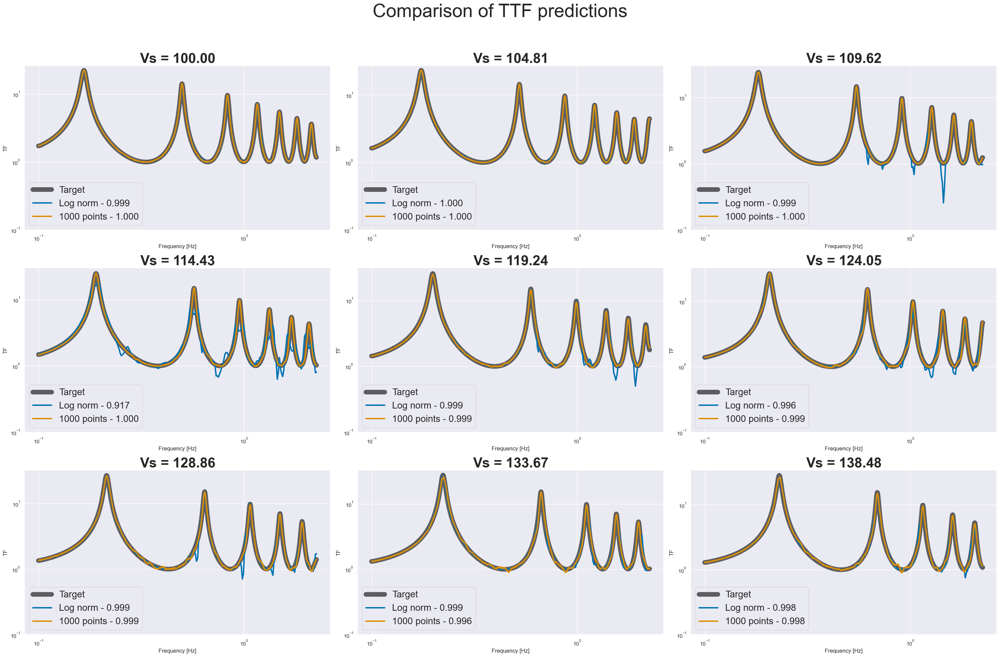

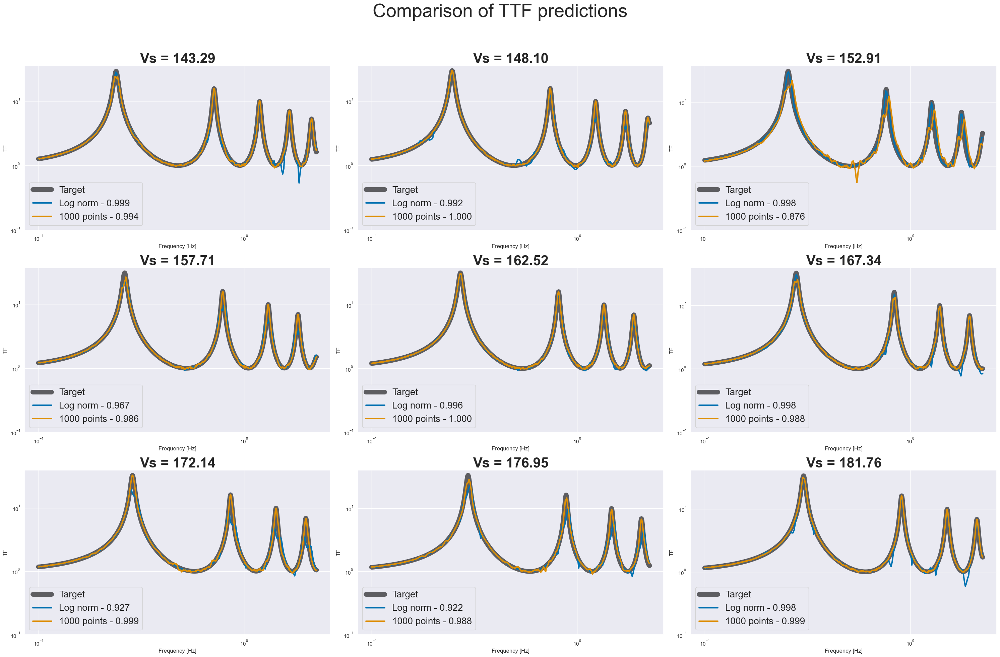

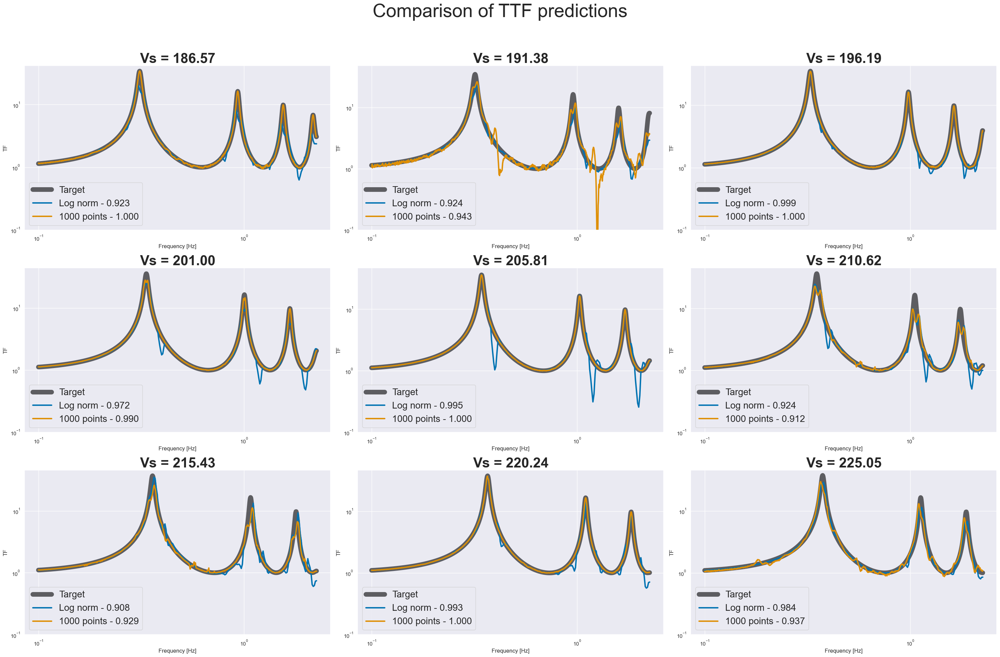

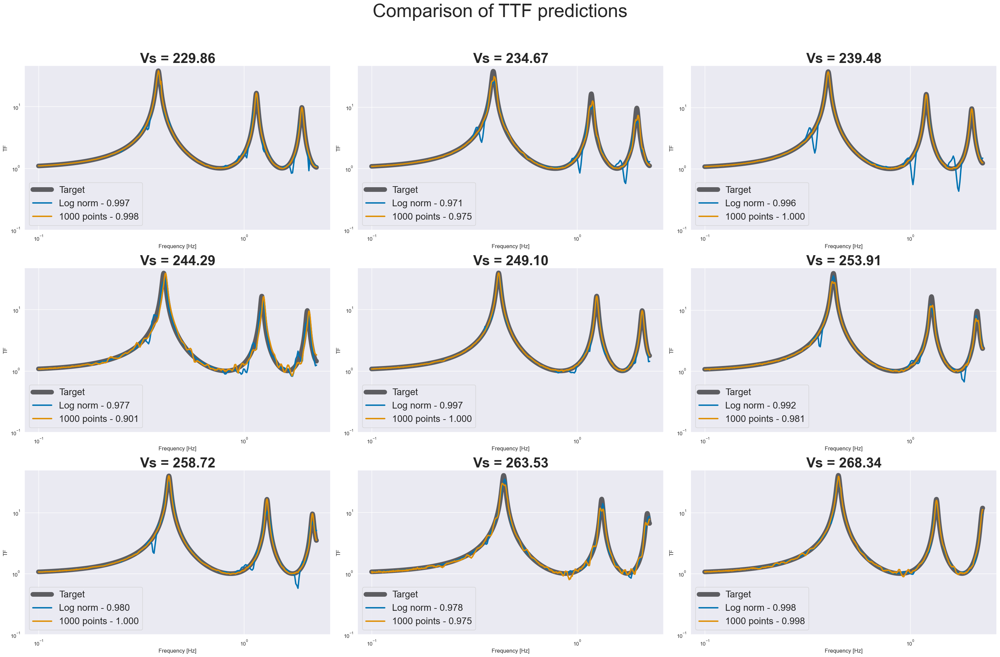

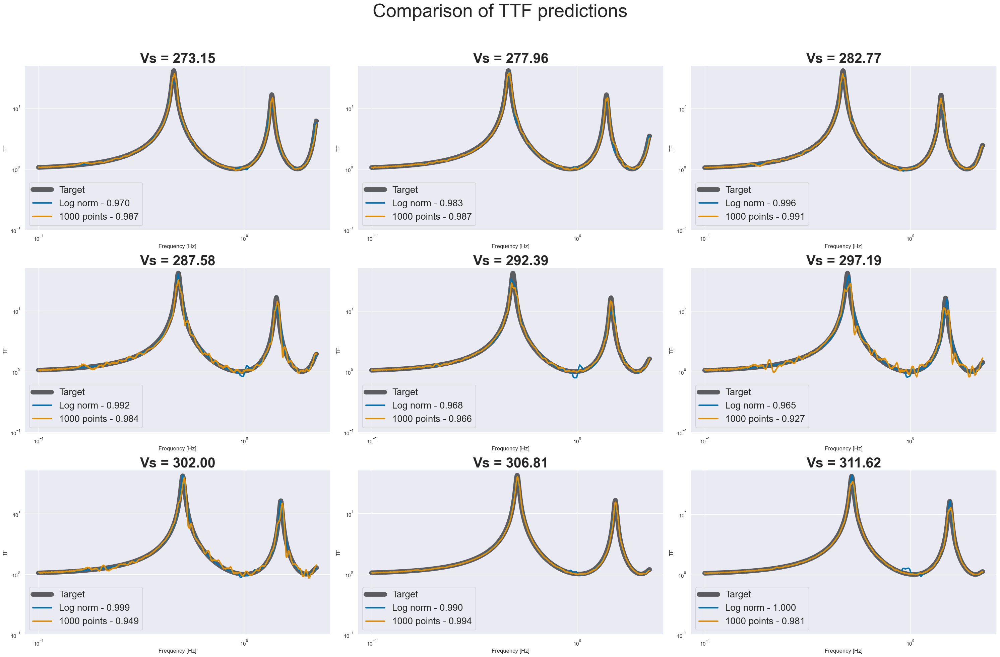

...

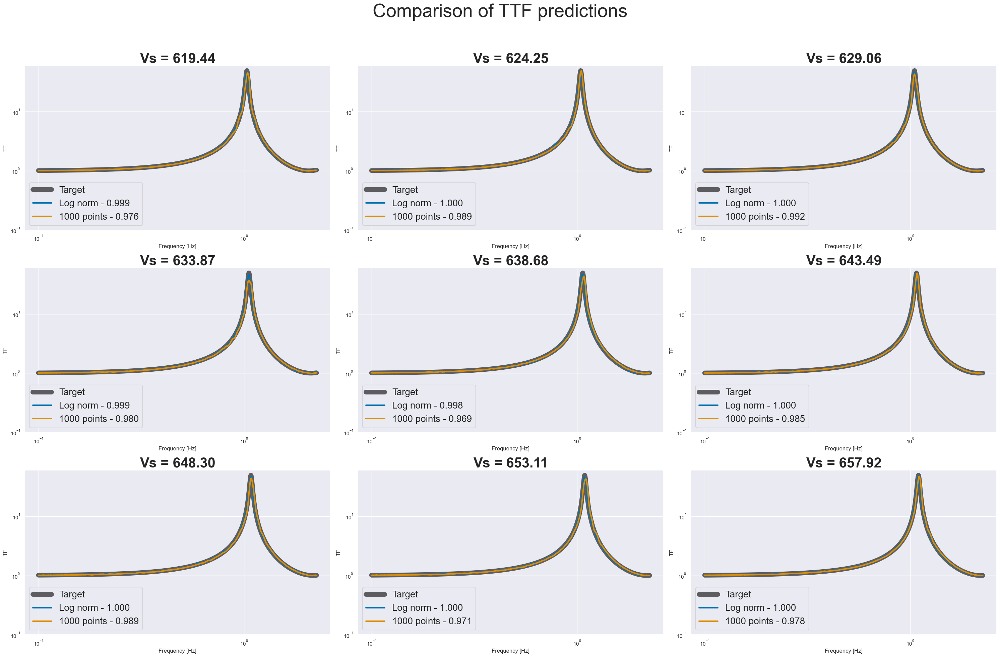

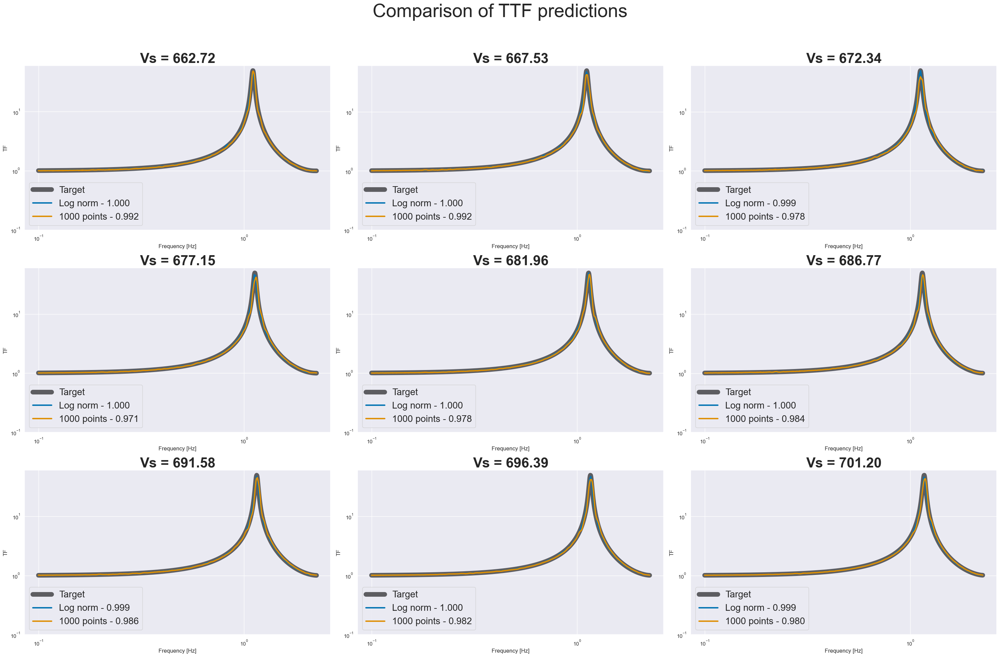

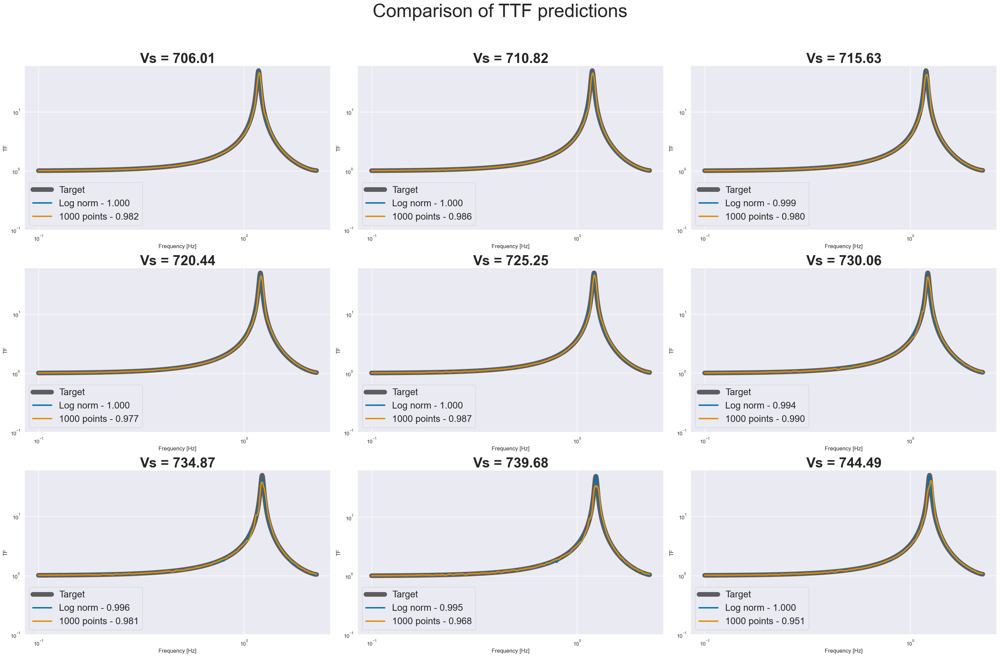

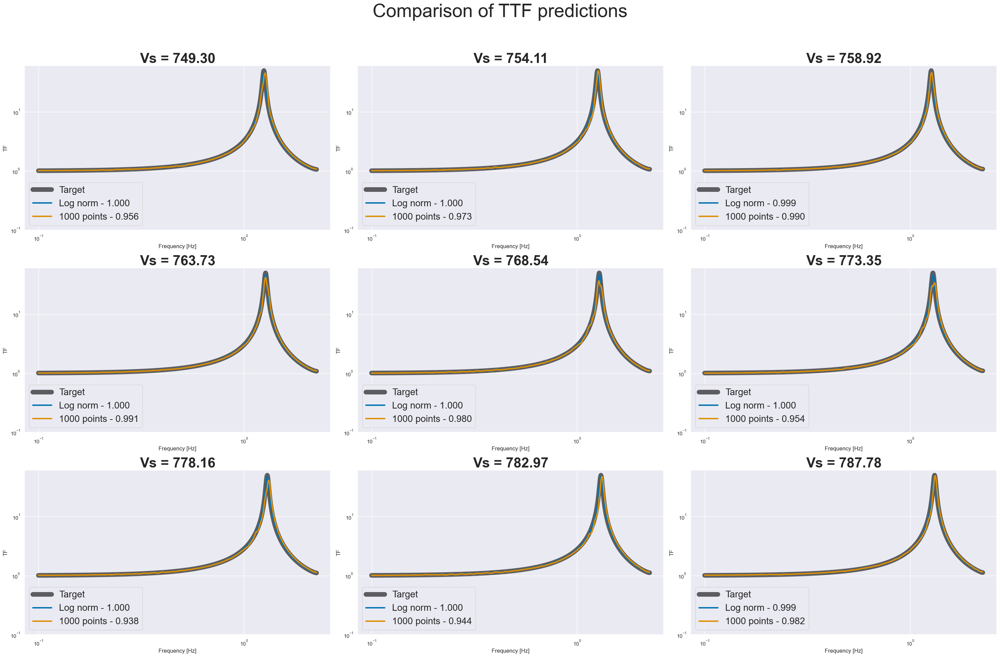

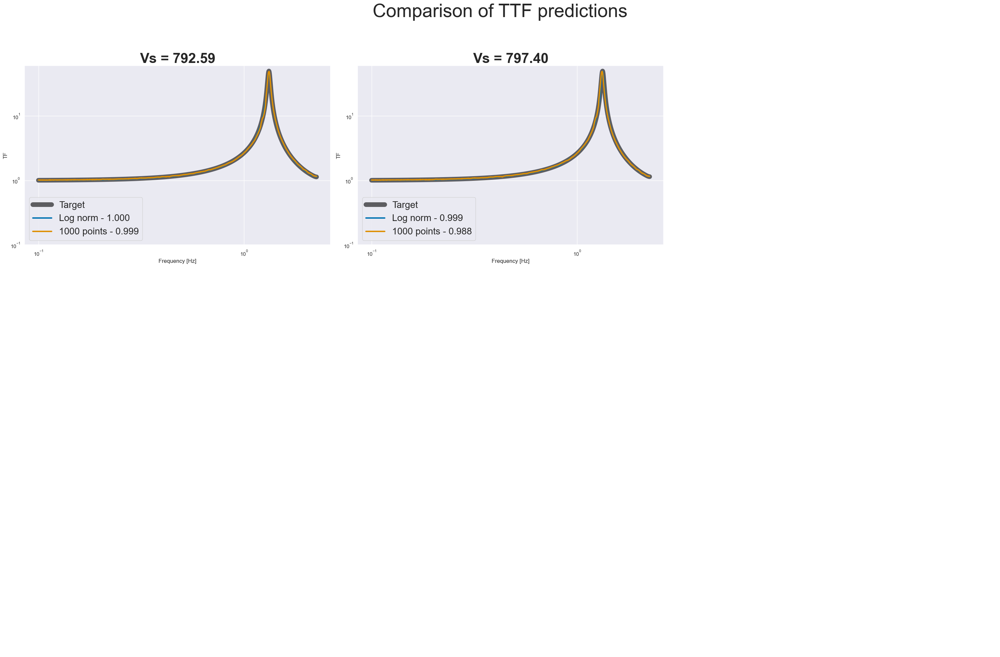

In [52]:
import matplotlib.pyplot as plt

# Assuming freq_array_1, freq_array_2, results_target, results_lognorm, results_1000, and Vs_array are defined

num_plots = len(Vs_array)
num_rows, num_cols = 3, 3
plots_per_figure = num_rows * num_cols

for k in range(0, num_plots, plots_per_figure):
    fig, ax = plt.subplots(num_rows, num_cols, figsize=(30, 20))
    fig.suptitle("Comparison of TTF predictions", fontsize=40)

    for i in range(num_rows):
        for j in range(num_cols):
            index = k + i * num_cols + j
            if index >= num_plots:
                ax[i, j].axis('off')  # Turn off the axis if there's no data
                continue

            line1, = ax[i, j].loglog(freq_array_2, results_target[index, :], label="Target", linewidth=10, alpha=0.6, color="black")
            line2, = ax[i, j].plot(freq_array_1, results_lognorm[index], label=f"Log norm - {df1['log_norm'][df1['Vs'] == Vs_array[index]].values[0]:.3f}", linewidth=3)
            line3, = ax[i, j].plot(freq_array_2, results_1000[index], label=f"1000 points - {df1['1000_points'][df1['Vs'] == Vs_array[index]].values[0]:.3f}", linewidth=3)
            ax[i, j].set_title(f"Vs = {Vs_array[index]:.2f}", fontweight="bold", fontsize=30)
            ax[i, j].set_xlabel("Frequency [Hz]")
            ax[i, j].set_ylabel("TF")
            ax[i, j].set_ylim([1e-1, None])
            ax[i, j].legend(loc="lower left", fontsize=20)





    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [149]:
# Select randomly 9 Vs values
np.random.seed(145)
random_indices = np.random.choice(len(Vs_array), 9, replace=False)
Vs_array = Vs_array[random_indices]
results_target = results_target[random_indices,:]
results_base = results_base[random_indices,:]
results_1000 = results_1000[random_indices,:]
results_lognorm = results_lognorm[random_indices,:]
results_lognorm_1000 = results_lognorm_1000[random_indices,:]
Vs_array

array([580.9619751 , 556.91400146, 518.43701172, 571.34301758,
       374.14801025, 672.3449707 , 186.57299805, 268.33700562,
       566.53302002])

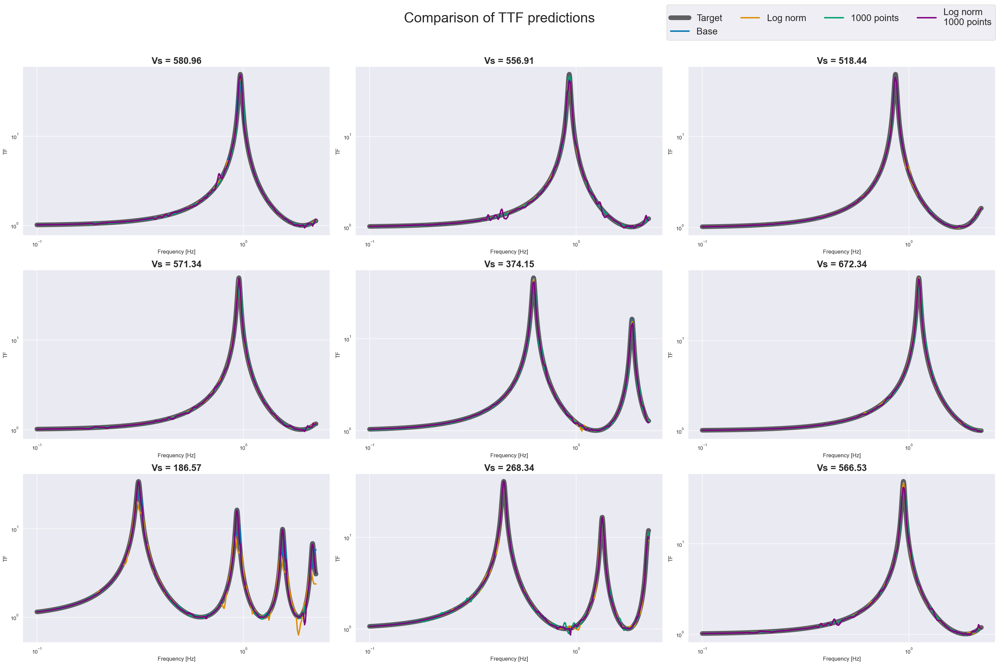

In [150]:
fig, ax = plt.subplots(3, 3, figsize=(30, 20))
fig.suptitle("Comparison of TTF predictions", fontsize=30)

handles, labels = [], []
record = 0

for i in range(3):
    for j in range(3):
        index = i * 3 + j
        line1, = ax[i, j].loglog(freq_array_2, results_target[index, :], label="Target", linewidth=10, alpha=0.6, color="black")
        line2, = ax[i, j].loglog(freq_array_1, results_base[index, :], label="Base", linewidth=3)
        line3, = ax[i, j].plot(freq_array_1, results_lognorm[index], label="Log norm", linewidth=3)
        line4, = ax[i, j].plot(freq_array_2, results_1000[index], label="1000 points", linestyle="-", linewidth=3)
        line5, = ax[i, j].loglog(freq_array_2, results_lognorm_1000[index, :], label="Log norm\n1000 points", linewidth=3, color="purple")
        ax[i, j].set_title(f"Vs = {Vs_array[index]:.2f}", fontweight="bold", fontsize=20)
        ax[i, j].set_xlabel("Frequency [Hz]")
        ax[i, j].set_ylabel("TF")

        if record == 0:
            for line in [line1, line2, line3, line4, line5]:
                handles.append(line)
                labels.append(line.get_label())
        record += 1

# Create a single legend for the entire figure
fig.legend(handles, labels, ncol=4, fontsize=20)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

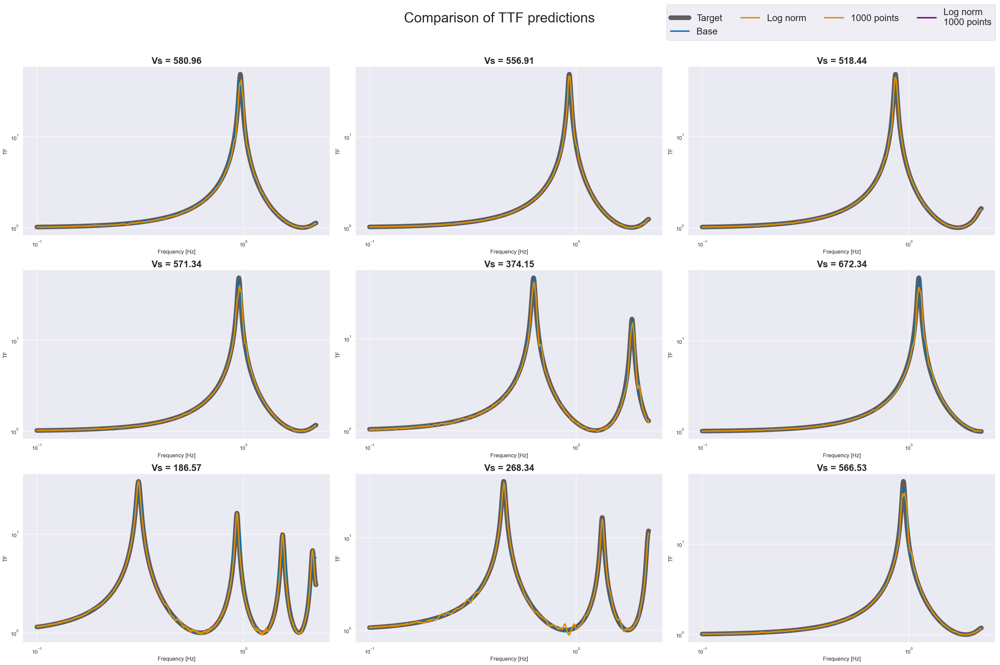

In [151]:
fig, ax = plt.subplots(3, 3, figsize=(30, 20))
fig.suptitle("Comparison of TTF predictions", fontsize=30)

handles, labels = [], []
record = 0

for i in range(3):
    for j in range(3):
        index = i * 3 + j
        line1, = ax[i, j].loglog(freq_array_2, results_target[index, :], label="Target", linewidth=10, alpha=0.6, color="black")
        line2, = ax[i, j].loglog(freq_array_1, results_base[index, :], label="Base", linewidth=3)
        #line3, = ax[i, j].plot(freq_array_1, results_lognorm[index], label="Log norm", linewidth=3)
        line4, = ax[i, j].plot(freq_array_2, results_1000[index], label="1000 points", linestyle="-", linewidth=3)
        #line5, = ax[i, j].loglog(freq_array_2, results_lognorm_1000[index, :], label="Log norm\n1000 points", linewidth=3, color="purple")
        ax[i, j].set_title(f"Vs = {Vs_array[index]:.2f}", fontweight="bold", fontsize=20)
        ax[i, j].set_xlabel("Frequency [Hz]")
        ax[i, j].set_ylabel("TF")

        if record == 0:
            for line in [line1, line2, line3, line4, line5]:
                handles.append(line)
                labels.append(line.get_label())
        record += 1

# Create a single legend for the entire figure
fig.legend(handles, labels, ncol=4, fontsize=20)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [155]:
# Comparison


Vs_array =  np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_range.csv", delimiter=",")

freq_array_1 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_freq_256.csv", delimiter=",")
freq_array_2 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_freq.csv", delimiter=",")
results_target_256 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_target_256.csv", delimiter=",")
results_target = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\TTF_target.csv", delimiter=",")
results_base = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_base.csv", delimiter=",")
results_1000 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_1000.csv", delimiter=",")
results_lognorm = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_lognorm.csv", delimiter=",")
results_lognorm_1000 = np.genfromtxt(r"..\FLAC\FLAC2D\1D 1 Column\Results\Vs_pred_1000_lognorm.csv", delimiter=",")

In [156]:
# Compute the MAE between 1000 and log_norm_1000 with target
mae_1000 = np.mean(np.abs(results_target - results_1000),axis=1)
mae_lognorm_1000 = np.mean(np.abs(results_target - results_lognorm_1000),axis=1)

# MAE for log_norm and base with target
mae_lognorm = np.mean(np.abs(results_target_256 - results_lognorm),axis=1)
mae_base = np.mean(np.abs(results_target_256 - results_base),axis=1)

In [157]:
# Compute RMSE
rmse_1000 = np.sqrt(np.mean((results_target - results_1000)**2, axis=1))
rmse_lognorm_1000 = np.sqrt(np.mean((results_target - results_lognorm_1000)**2, axis=1))

rmse_lognorm = np.sqrt(np.mean((results_target_256 - results_lognorm)**2, axis=1))
rms_base = np.sqrt(np.mean((results_target_256 - results_base)**2, axis=1))

In [158]:
# Order Vs_array from lowest to highest
order = np.argsort(Vs_array)
new_Vs_array = Vs_array[order]
mae_1000 = mae_1000[order]
mae_lognorm_1000 = mae_lognorm_1000[order]
mae_lognorm = mae_lognorm[order]
mae_base = mae_base[order]

rmse_1000 = rmse_1000[order]
rmse_lognorm_1000 = rmse_lognorm_1000[order]
rmse_lognorm = rmse_lognorm[order]
rms_base = rms_base[order]

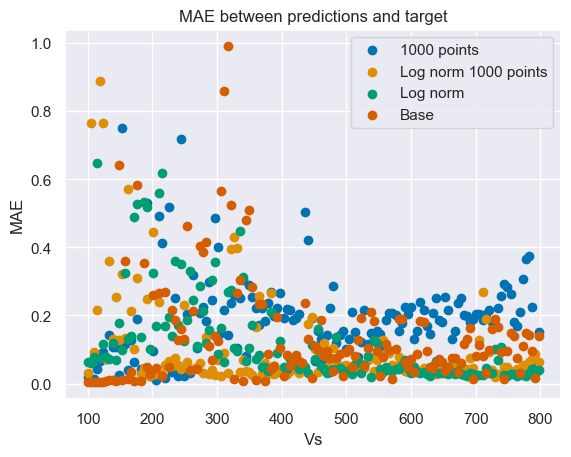

In [159]:
plt.figure()
plt.scatter(new_Vs_array, mae_1000, label="1000 points")
plt.scatter(new_Vs_array, mae_lognorm_1000, label="Log norm 1000 points")
plt.scatter(new_Vs_array, mae_lognorm, label="Log norm")
plt.scatter(new_Vs_array, mae_base, label="Base")
plt.title("MAE between predictions and target")
plt.xlabel("Vs")
plt.ylabel("MAE")
plt.legend()

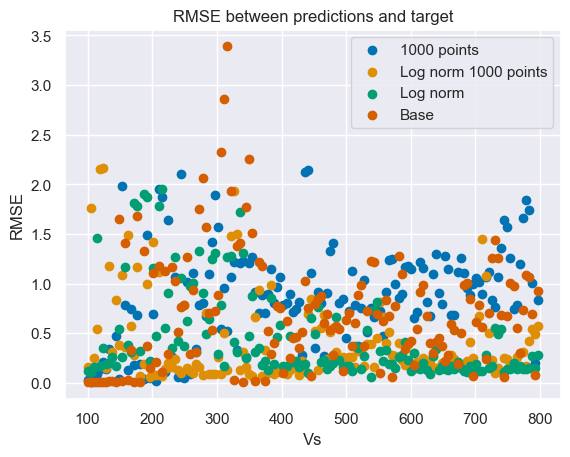

In [160]:
plt.figure()
plt.scatter(new_Vs_array, rmse_1000, label="1000 points")
plt.scatter(new_Vs_array, rmse_lognorm_1000, label="Log norm 1000 points")
plt.scatter(new_Vs_array, rmse_lognorm, label="Log norm")
plt.scatter(new_Vs_array, rms_base, label="Base")
plt.title("RMSE between predictions and target")
plt.xlabel("Vs")
plt.ylabel("RMSE")
plt.legend()

In [161]:
# Spearman correlation
from scipy.stats import spearmanr

spearmanr_dict = {"base":[], "log_norm":[], "log_norm_1000":[], "1000_points":[]}

for i in range(len(Vs_array)):
    spearmanr_dict["base"].append(spearmanr(results_target_256[i], results_base[i])[0])
    spearmanr_dict["log_norm"].append(spearmanr(results_target_256[i], results_lognorm[i])[0])
    spearmanr_dict["log_norm_1000"].append(spearmanr(results_target[i], results_lognorm_1000[i])[0])
    spearmanr_dict["1000_points"].append(spearmanr(results_target[i], results_1000[i])[0])




In [162]:
spearm_df = pd.DataFrame(spearmanr_dict)
spearm_df["Vs"] = Vs_array

# Order by Vs
spearm_df = spearm_df.sort_values(by="Vs", ascending=True)

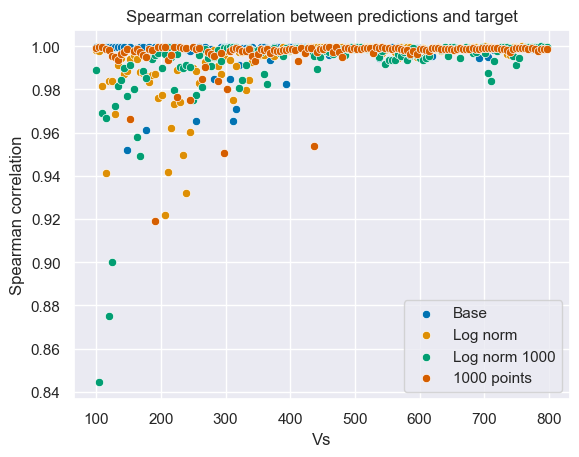

In [163]:
sns.scatterplot(x="Vs", y="base", data=spearm_df, label="Base")
sns.scatterplot(x="Vs", y="log_norm", data=spearm_df, label="Log norm")
sns.scatterplot(x="Vs", y="log_norm_1000", data=spearm_df, label="Log norm 1000")
sns.scatterplot(x="Vs", y="1000_points", data=spearm_df, label="1000 points")
plt.title("Spearman correlation between predictions and target")
plt.xlabel("Vs")
plt.ylabel("Spearman correlation")
plt.legend()
plt.show()

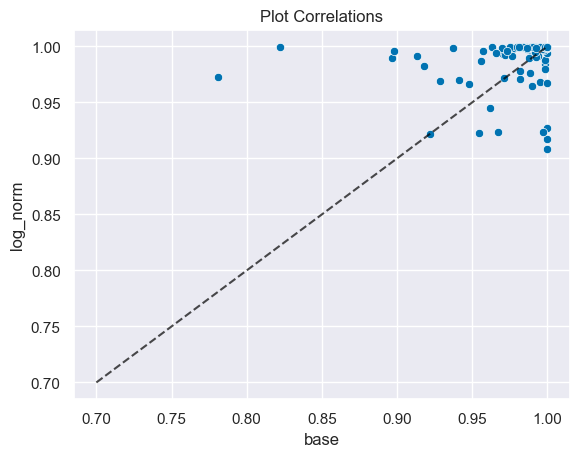

Above - log_norm: 67.81 %, Below - base: 32.19 %


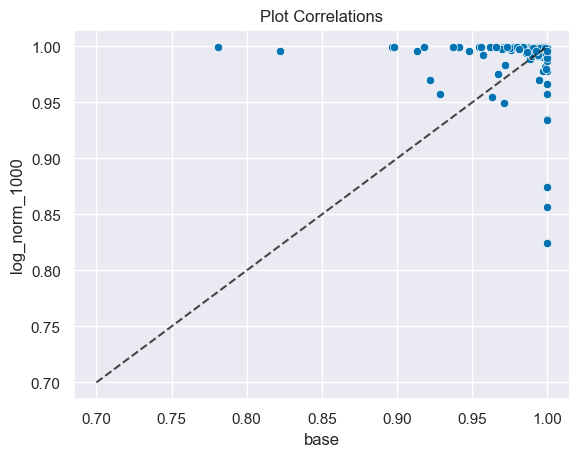

Above - log_norm_1000: 73.29 %, Below - base: 26.71 %


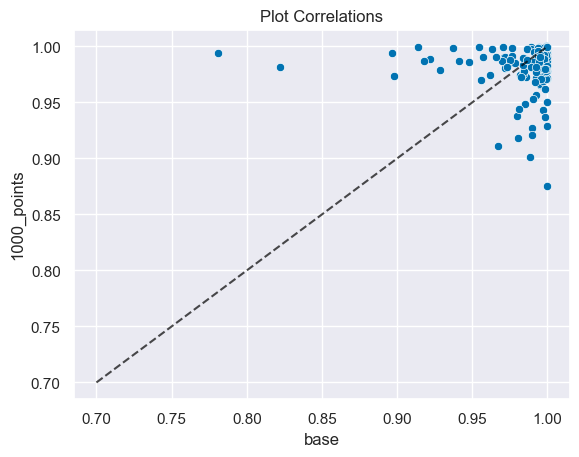

Above - 1000_points: 30.82 %, Below - base: 69.18 %


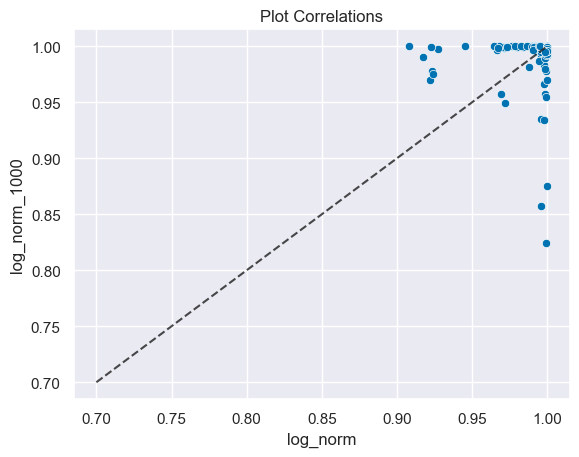

Above - log_norm_1000: 44.52 %, Below - log_norm: 55.48 %


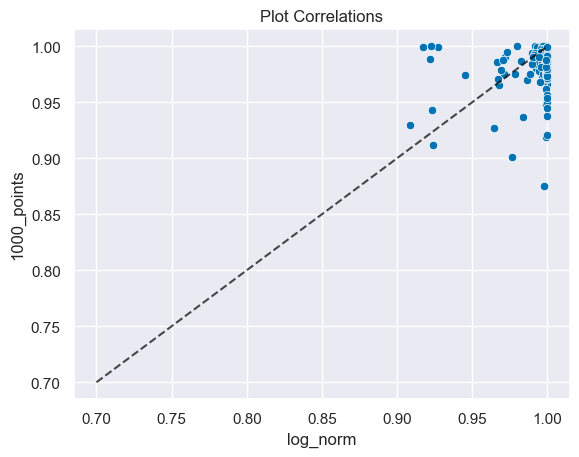

Above - 1000_points: 24.66 %, Below - log_norm: 75.34 %


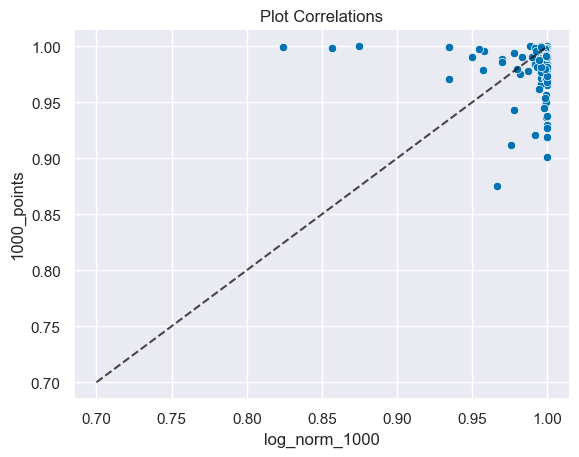

Above - 1000_points: 21.23 %, Below - log_norm_1000: 78.77 %


In [135]:
plotted_pairs = set()

spearm_df.drop(columns="Vs", inplace=True)

for i in spearm_df.columns:
    for j in spearm_df.columns:
        if i == j:
            continue
        elif (i, j) not in plotted_pairs and (j, i) not in plotted_pairs:
            plot_comparison(i, j)
            plotted_pairs.add((i, j))